### Graham Kerr
#### graham.s.kerr@NASA.gov; kerrg@cua.edu

<H1 font size="+3" style="color:red">
O I in Flares<br>
-- IRIS SJI Basic Plotting <br>
</H1>

<b>This notebook will</b>
> - Read in pre-saved pickle files of SJI data
> - Plot some snapshots
> - Make some png files





---
### <b style="color:blue"> Some set up </b>

***Import Modules***

> - Note that here I have called a module called 'utils' that contains a few functions that I have collected. The python session knows where they are held as I insert their location to the path. You will have to modify that line to point to where you put utils.

In [1]:
##
## Import various modules -- can tidy up later
##
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
#%matplotlib tk
import sys
sys.path.insert(0,'/Users/gskerr1/Documents/Research/Python_Programs/MiscCodes/')
import utils
import os
import re
from scipy import io
import pickle
import cmocean
import copy
import iris_lmsalpy
# import astropy
import pandas as pd
# import hissw
# from astropy.coordinates import SkyCoord
# import astropy.units as u
# from sunpy.coordinates import frames
# import sunpy.map

---
### <b style="color:blue"> Set up some plotting parameters </b>
> - These are just my personal preferences for plot styles... you dont need to use them, or can change them my modifying the params in the function, or generally changing rcParams (check the matplotlib docs)

In [2]:
plot_dict = utils.plotsetup_image(font_size = 22)
plt.rcParams.update(plot_dict)

---
### <b style="color:blue"> Read in the data </b>


In [3]:
##
## Load the SJI data  
##
dir1 = '/Users/gskerr1/Documents/Research/Melissa_OI_IRIS/2014_09_10_1130/'
file_sji = dir1+'IRIS_SJI_2014_Sept_10_exptimecorr.pkl'
with open(file_sji, 'rb') as output:  
    sji_dict = pickle.load(output)

---
### <b style="color:blue"> Some basic plotting </b>
> - First, lets just play around with some basic matplotlib functionality
> - We will plot images from the SJI data, and play with changing the colour tables

In [4]:
sji_dict.keys()

dict_keys(['sji_1400', 'sji_2796', 'xcen_1400', 'xcen_2796', 'ycen_1400', 'ycen_2796', 'SLTPX1IX_1400', 'SLTPX1IX_2796', 'lcslit_1400', 'lcslit_2796', 'hdr_1400_ext0', 'hdr_2796_ext0', 'time_1400', 'time_2796', 'readme'])

> - First lets just plot the first frame
> - Do you know why we need to have 'origin = lower'?

findfont: Font family ['Avenir LT Std'] not found. Falling back to DejaVu Sans.


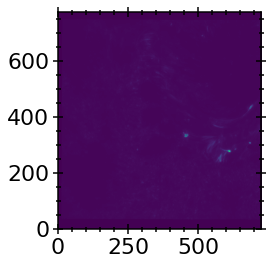

In [5]:
tind = 0
plt.imshow(sji_dict['sji_1400'][:,:,tind],origin = 'lower')
plt.show()

> - It is hard to see some details here, so lets try scaling the data
> - When it comes to plotting images we can either saturate high intensity areas to see weaker features, or we can scale the whole image by some index, e.g the square or quarter root (there are more technical ways too but we probably dont need those)

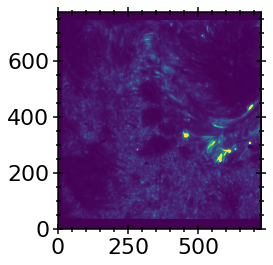

<ipython-input-6-bb369d7226ae>:5: RuntimeWarning: invalid value encountered in power
  plt.imshow(sji_dict['sji_1400'][:,:,tind]**0.25,origin = 'lower',vmin=0)


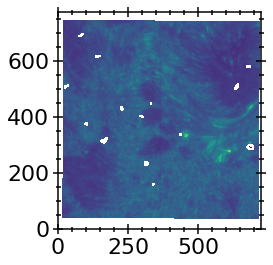

In [6]:
tind = 0
plt.imshow(sji_dict['sji_1400'][:,:,tind],origin = 'lower',
           vmin=0,vmax=np.nanmax(sji_dict['sji_1400'][:,:,:])/10)
plt.show()
plt.imshow(sji_dict['sji_1400'][:,:,tind]**0.25,origin = 'lower',vmin=0)
plt.show()

> - Lets look at a time when the flare is happening
> - Then, zoom in on the flare region (note that python matrix ordering means that y comes first, then x)
> - Finally, add some labels

<ipython-input-7-773c0ca432f4>:2: RuntimeWarning: invalid value encountered in power
  plt.imshow(sji_dict['sji_1400'][:,:,tind]**0.25,origin = 'lower',


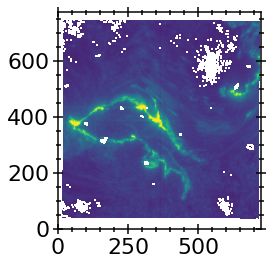

<ipython-input-7-773c0ca432f4>:10: RuntimeWarning: invalid value encountered in power
  plt.imshow(sji_dict['sji_1400'][yind1:yind2,xind1:xind2,tind]**0.25,origin = 'lower',


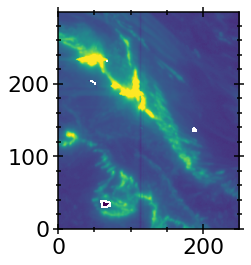

<ipython-input-7-773c0ca432f4>:14: RuntimeWarning: invalid value encountered in power
  plt.imshow(sji_dict['sji_1400'][yind1:yind2,xind1:xind2,tind]**0.25,origin = 'lower',
findfont: Font family ['Avenir LT Std'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Avenir LT Std'] not found. Falling back to DejaVu Sans.


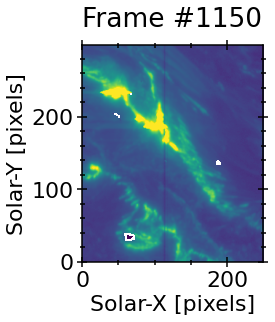

In [7]:
tind = 1150
plt.imshow(sji_dict['sji_1400'][:,:,tind]**0.25,origin = 'lower',
           vmin=0)
plt.show()

xind1 = 250
xind2 = 500
yind1 = 200
yind2 = 500
plt.imshow(sji_dict['sji_1400'][yind1:yind2,xind1:xind2,tind]**0.25,origin = 'lower',
           vmin=0,aspect='equal')
plt.show()

plt.imshow(sji_dict['sji_1400'][yind1:yind2,xind1:xind2,tind]**0.25,origin = 'lower',
           vmin=0,aspect='equal')
plt.title('Frame #%d'%(tind))
plt.xlabel('Solar-X [pixels]')
plt.ylabel('Solar-Y [pixels]')
plt.show()



> - Note that in the last figure, it starts from pixel = [0,0], even though we select a subset
> - If we want it to display the pixel number from the actual data cube we need to provide that info
> - Note that Imshow assumes that the pixels are of constant size

<ipython-input-8-f2b376555d56>:5: RuntimeWarning: invalid value encountered in power
  plt.imshow(sji_dict['sji_1400'][yind1:yind2,xind1:xind2,tind]**0.25,origin = 'lower',


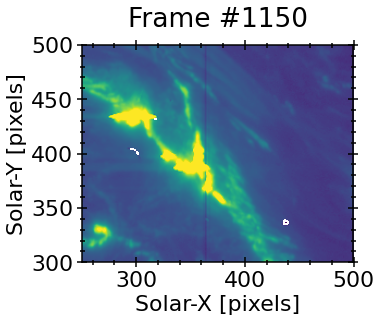

In [8]:
xind1 = 250
xind2 = 500
yind1 = 300
yind2 = 500
plt.imshow(sji_dict['sji_1400'][yind1:yind2,xind1:xind2,tind]**0.25,origin = 'lower',
           vmin=0,aspect='equal',
           extent = [xind1, xind2, yind1, yind2])
plt.title('Frame #%d'%(tind))
plt.xlabel('Solar-X [pixels]')
plt.ylabel('Solar-Y [pixels]')
plt.show()

> - What if we want to show the actual location on the Sun, not just pixel numbers?
> - Using information about pixel size we can construct arrays that hold the position in arcsecs on the Sun for x and y 

In [9]:
xmin_sji= np.min(sji_dict['xcen_1400'][tind]-sji_dict['hdr_1400_ext0']['CDELT1']*(sji_dict['hdr_1400_ext0']['NAXIS1']-1.e0)/2.e0)
xmax_sji= np.max(sji_dict['xcen_1400'][tind]+sji_dict['hdr_1400_ext0']['CDELT1']*(sji_dict['hdr_1400_ext0']['NAXIS1']-1.e0)/2.e0)
xcoord_sji = np.linspace(xmin_sji,xmax_sji,num=sji_dict['hdr_1400_ext0']['NAXIS1']) 
ymin_sji= np.min(sji_dict['ycen_1400'][tind]-sji_dict['hdr_1400_ext0']['CDELT2']*(sji_dict['hdr_1400_ext0']['NAXIS2']-1.e0)/2.e0)
ymax_sji= np.max(sji_dict['ycen_1400'][tind]+sji_dict['hdr_1400_ext0']['CDELT2']*(sji_dict['hdr_1400_ext0']['NAXIS2']-1.e0)/2.e0)
ycoord_sji = np.linspace(ymin_sji,ymax_sji,num=sji_dict['hdr_1400_ext0']['NAXIS2']) 
    


<ipython-input-10-f4a4ed1b623e>:5: RuntimeWarning: invalid value encountered in power
  plt.imshow(sji_dict['sji_1400'][yind1:yind2,xind1:xind2,tind]**0.25,origin = 'lower',


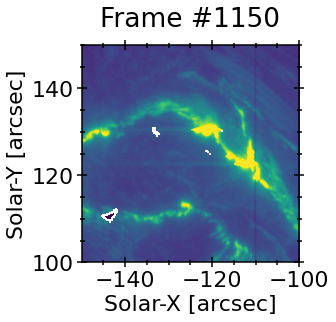

In [10]:
xind1 = 0
xind2 = 725
yind1 = 0
yind2 = 775
plt.imshow(sji_dict['sji_1400'][yind1:yind2,xind1:xind2,tind]**0.25,origin = 'lower',
           vmin=0,aspect='equal',
           extent = [xcoord_sji[xind1],
                     xcoord_sji[xind2],
                     ycoord_sji[yind1],
                     ycoord_sji[yind2]])
plt.title('Frame #%d'%(tind))
plt.xlabel('Solar-X [arcsec]')
plt.ylabel('Solar-Y [arcsec]')
plt.xlim([-150,-100])
plt.ylim([100,150])
plt.show()


> - Now, what if we want to see a series of images

<ipython-input-11-93621664c46d>:7: RuntimeWarning: invalid value encountered in power
  plt.imshow(sji_dict['sji_1400'][yind1:yind2,xind1:xind2,tind]**0.25,origin = 'lower',


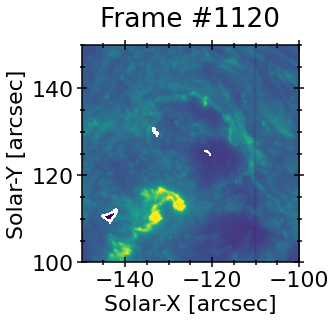

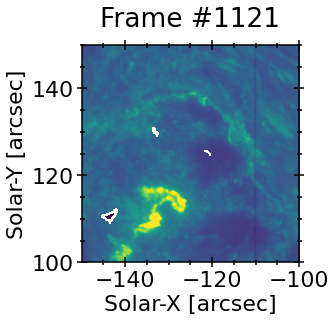

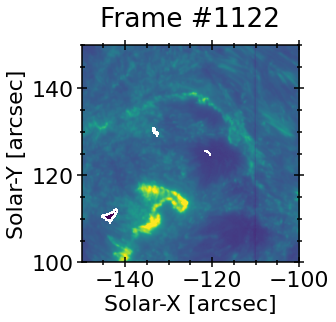

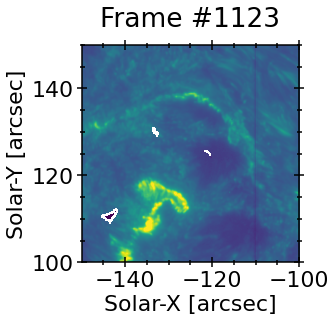

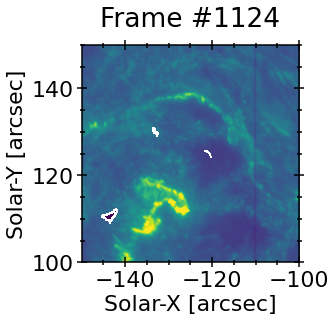

...

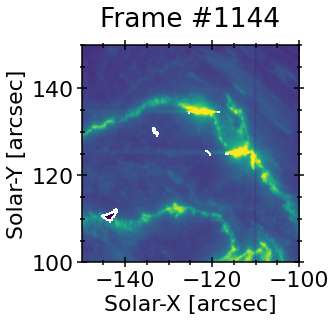

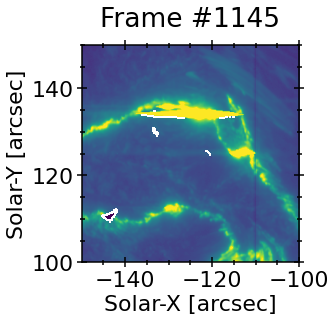

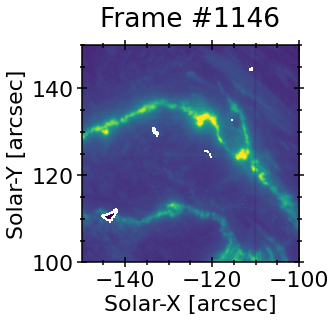

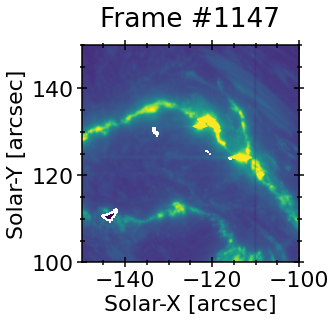

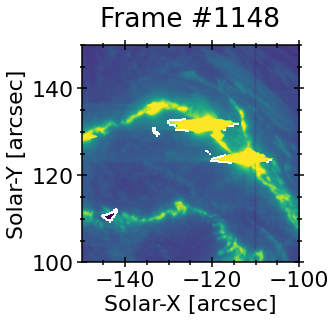

KeyboardInterrupt: 

In [11]:
xind1 = 0
xind2 = sji_dict['sji_1400'].shape[1]-1
yind1 = 0
yind2 = sji_dict['sji_1400'].shape[0]-1

for tind in range(1120,1150):
    plt.imshow(sji_dict['sji_1400'][yind1:yind2,xind1:xind2,tind]**0.25,origin = 'lower',
               vmin=0,aspect='equal',
               extent = [xcoord_sji[xind1],
                         xcoord_sji[xind2],
                         ycoord_sji[yind1],
                         ycoord_sji[yind2]])
    plt.title('Frame #%d'%(tind))
    plt.xlabel('Solar-X [arcsec]')
    plt.ylabel('Solar-Y [arcsec]')
    plt.xlim([-150,-100])
    plt.ylim([100,150])
    plt.show()

***Save some PNG figures, and use the ax object methods to plot***
> - I prefer using the axes methods for plotting 'good' images rather than the quick way above
> - Here we will also change the colour map
> - Note that in each frame we re-scale the colourmap to some index. How might we modify the code below to keep a consistent scaled colourmap from frame-to-frame (hint, look above for vmax)

<ipython-input-12-6b84c1a52271>:6: RuntimeWarning: invalid value encountered in power
  data = copy.deepcopy(sji_dict['sji_1400'])**0.25


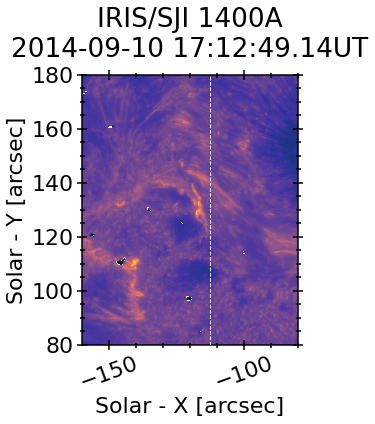

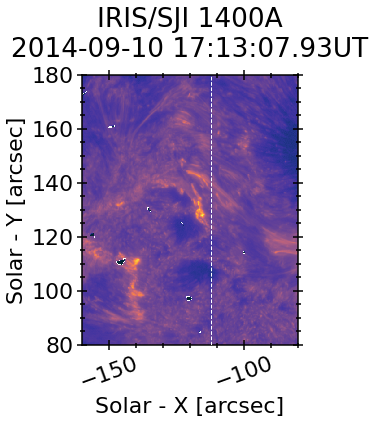

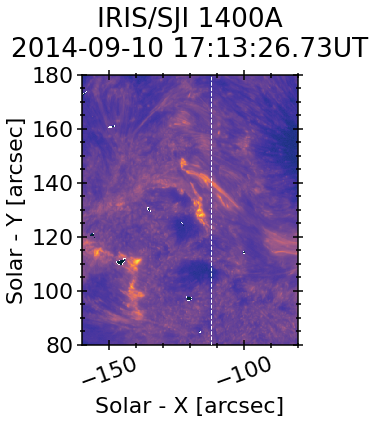

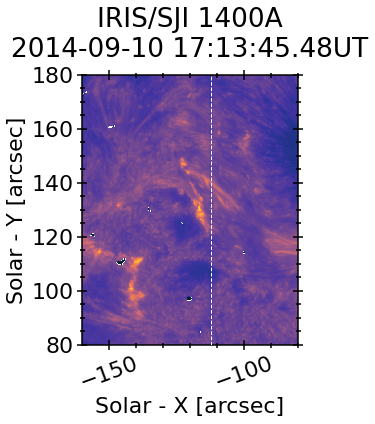

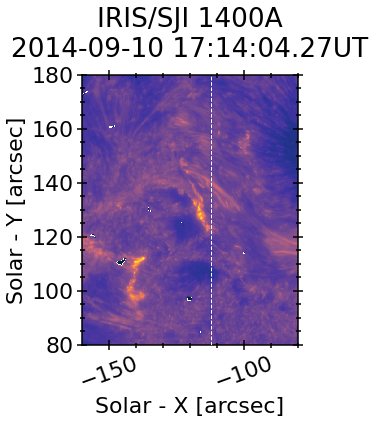

...

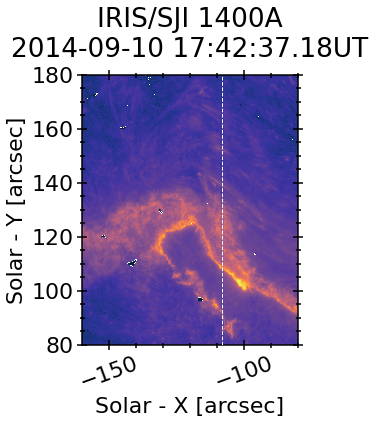

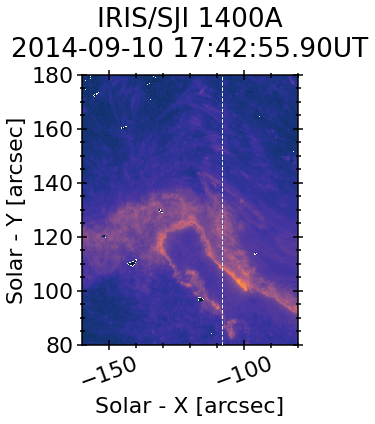

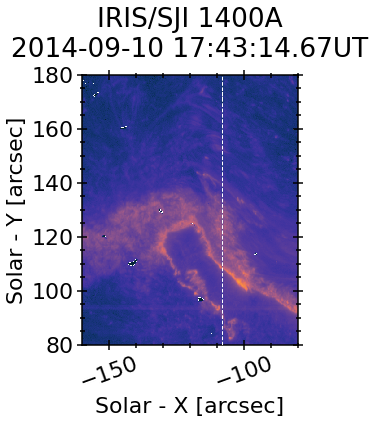

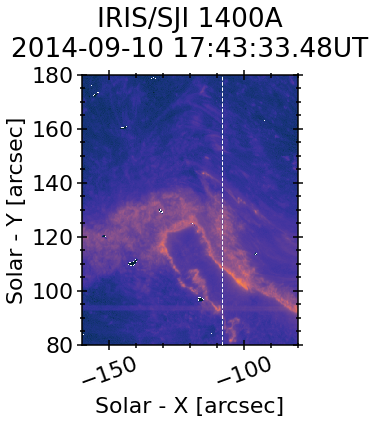

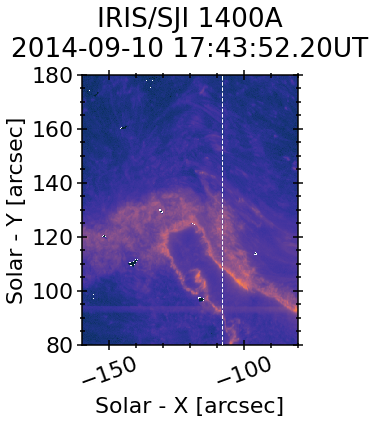

In [12]:
savepng = False

dirout = './'
fname_out = 'IRISSJI_1400A_2014_Sept_10'

data = copy.deepcopy(sji_dict['sji_1400'])**0.25

index = sji_dict['hdr_1400_ext0']

t1 = 1100
t2 = 1200

cmap1400 = cmocean.cm.thermal

xrange = [-160,-80]
yrange = [80, 180]

xsel1_wl = 0
xsel2_wl = sji_dict['sji_1400'].shape[1]-1
ysel1_wl = 0
ysel2_wl = sji_dict['sji_1400'].shape[0]-1

deltaxr = np.abs(xrange[0]-xrange[-1])
deltayr = np.abs(yrange[0]-yrange[-1])

aspect = deltaxr/deltayr

xsize = 4
ysize = 4

dx = 0.75
dy = dx/aspect
y1 = 0.05
x1 = 0.05
sx = 0.15


counter = 0
for tind in range(t1,t2):
    
    xmin_sji= np.min(sji_dict['xcen_1400'][tind]-sji_dict['hdr_1400_ext0']['CDELT1']*(sji_dict['hdr_1400_ext0']['NAXIS1']-1.e0)/2.e0)
    xmax_sji= np.max(sji_dict['xcen_1400'][tind]+sji_dict['hdr_1400_ext0']['CDELT1']*(sji_dict['hdr_1400_ext0']['NAXIS1']-1.e0)/2.e0)
    xcoord_sji = np.linspace(xmin_sji,xmax_sji,num=sji_dict['hdr_1400_ext0']['NAXIS1']) 
    ymin_sji= np.min(sji_dict['ycen_1400'][tind]-sji_dict['hdr_1400_ext0']['CDELT2']*(sji_dict['hdr_1400_ext0']['NAXIS2']-1.e0)/2.e0)
    ymax_sji= np.max(sji_dict['ycen_1400'][tind]+sji_dict['hdr_1400_ext0']['CDELT2']*(sji_dict['hdr_1400_ext0']['NAXIS2']-1.e0)/2.e0)
    ycoord_sji = np.linspace(ymin_sji,ymax_sji,num=sji_dict['hdr_1400_ext0']['NAXIS2']) 

    fig = plt.figure(figsize=(xsize, ysize))
    ax1 = fig.add_axes([x1, y1, dx, dy])


    ax1.set_xlim(xrange[0], xrange[-1])
    ax1.set_ylim(yrange[0], yrange[-1])

    ax1.set_ylabel('Solar - Y [arcsec]')
    ax1.set_xlabel('Solar - X [arcsec]')
    ax1.xaxis.set_tick_params(rotation=20)
    ax1.tick_params(which='both', direction='inout')

    im = ax1.imshow(data[:,:,tind],
                    cmap=cmap1400, 
                    origin='lower',interpolation='nearest', aspect='equal',
                    extent = [xcoord_sji[xsel1_wl],xcoord_sji[xsel2_wl],
                              ycoord_sji[ysel1_wl],ycoord_sji[ysel2_wl]])


#     ax1.text(1.05, 0.95, 'IRIS/SJI 1400A', color = 'black', transform = ax1.transAxes, fontsize = 15)
#     ax1.text(1.05, 0.90, sji_dict['time_1400'][tind]+'UT'  , color = 'black',transform=ax1.transAxes,fontsize=15)     
    ax1.set_title('IRIS/SJI 1400A\n'+sji_dict['time_1400'][tind]+'UT')
    ax1.axvline(x=sji_dict['lcslit_1400'][tind], color = 'white', linewidth=1, linestyle='--', zorder = 20)

    if savepng == True:
        plt.savefig(fname_out+'_%04d.png' %(counter), format='png', bbox_inches = 'tight', dpi=300)
    
    counter+= 1
    
    plt.show()